In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
pd.set_option('display.max_columns', 100)
from helpers import *

In [2]:
import torch
from torch.autograd import Variable
import torch.nn.functional as F      # activation function
from sklearn.model_selection import train_test_split  # split adata
from sklearn.preprocessing import StandardScaler      # Standardzation

In [3]:
DATA_FOLDER ='../data/'

In [4]:
RESULTS_FOLDER= '../results/neural_network/'

**Settings**

The following script is useful to perform a neural network regression over the data split season wise and yearly wise.

In order to optimize the neural network the section 'Neural Network', 'Build the Net' can be modified by adding layers and neurons. The architecture is a feedforward one. The methods' parameters used to prevent the algorithm from overfitting can be tuned: `max_rate` is the rate defining the maximum acceptable change in mse from one epoch to the next one without stopping the training algorithm; `max_moving_avg` is the maximum number of consecutive iterations that the rate of mse moving average can have before stopping the training.

### Regression matrix manipulation

Importing regression matrix

In [5]:
tot_df=pd.read_csv(DATA_FOLDER+'regression_mat_year.csv',index_col=0)

Combine magnitude and speed direction in order to get speed vector components

In [6]:
tot_df=vectorize_wind_speed(tot_df)

Visualize the shape of the matrix

In [7]:
tot_df.shape

(535470, 23)

In [8]:
# shortening matrix for developping purposes

# tot_df=tot_df.sample(frac=0.7, replace=True)
# tot_df.shape

## Splitting the data

Set the random state in order to split the data set into training, evaluation and testing set

In [9]:
random_state=50

Creating the input and the output 

In [10]:
X = np.array(tot_df.drop(columns=['u_x', 'u_y','u_z']))
Y = np.array(tot_df[['u_x', 'u_y']])# First consider 1 dimension output

Splitting the data set into training and creating a temporary dataframe which will be splitted in test and evaluation

In [11]:
x_tr_, X_temp_, y_tr_, Y_temp_ = train_test_split(X, Y, test_size = 0.4, random_state = random_state)

Creating the test and the evalation set

In [12]:
X_te_, x_ev_, Y_te_, y_ev_ = train_test_split(X_temp_, Y_temp_, test_size = 0.5, random_state = random_state)

Splitting the evaluation set into anemometers. This is later useful to visualize the training behaviour of the prediction per anemometer

In [13]:
x_ev_hs_, y_ev_hs_=split_hs_test(x_ev_,y_ev_,hs=np.arange(1.5,22,4))

Split the dataset according to seassons

In [14]:
df_spring, df_summer, df_autumn, df_winter=season_splitter(tot_df)
df_seasons=[df_spring, df_summer, df_autumn, df_winter]

## Preparing the data for season 

Creating a function which splits standardize the features of a datset and creates a training, an evaluation and a test set. Divide the datasets according to different anemometers too.

In [15]:
def seasons_net(df_seasons):
    
    x_tr_standard_variables=[]
    y_tr_variables=[]
    
    x_ev_standard_hs_variables=[]
    x_ev_standard_variables=[]
    y_ev_variables=[]
    y_ev_hs_seasons=[]
    
    x_seasons_tr_=[]
    X_seasons_te_=[]
    Y_seasons_te_=[]
    
    for df_season in df_seasons:
        
        X = np.array(df_season.drop(columns=['u_x', 'u_y','u_z']))
        Y = np.array(df_season[['u_x', 'u_y']])
        
        #creating the train set and the test set
        x_season_tr_, X_season_temp_, y_season_tr_, Y_season_temp_ = train_test_split(X, Y, test_size = 0.6, random_state = random_state)

        #creating the train set and the evaluation test out of the train set
        X_season_te_, x_season_ev_, Y_season_te_, y_season_ev_ = train_test_split(X_season_temp_, Y_season_temp_, test_size = 0.5, random_state = random_state)

        #append values for each season
        x_seasons_tr_.append(x_season_tr_)
        X_seasons_te_.append(X_season_te_)
        Y_seasons_te_.append(Y_season_te_)
        
        #splitting the evaluation data in anemometers 
        x_ev_hs_, y_ev_hs_=split_hs_test(x_season_ev_,y_season_ev_,hs=np.arange(1.5,22,4))
        
        y_ev_hs_seasons.append(y_ev_hs_)
        
        k = StandardScaler().fit(x_season_tr_)
        x_season_tr_ = k.transform(x_season_tr_)
        
        # standardize the evaluation test according to the metric of the training set
        
        x_season_ev_ = k.transform(x_season_ev_)
        
        # standardize the anemometers values of the evaluation test according to the metric of the training set
        x_ev_standard_hs_=[]
        for x_ev_h_ in x_ev_hs_:
    
            x_ev_standard_hs_.append(k.transform(x_ev_h_))
        
        # converting the evalation and training data into tensors and into variables
        elements_array=[x_season_tr_, x_season_ev_, y_season_tr_, y_season_ev_]
        elements_variables=[]
        
        for element in elements_array:
            
            elements_variables.append(Variable(torch.from_numpy(element).type(torch.FloatTensor)))
        
        # converting the anemometers arrays into tensors and into variables
        x_ev_standard_hs_variable=[]

        for x_ev_standard_h_ in x_ev_standard_hs_:

            x_ev_standard_hs_variable.append(Variable(torch.from_numpy(x_ev_standard_h_).type(torch.FloatTensor)))
        
        x_tr_standard_variables.append(elements_variables[0])
        y_tr_variables.append(elements_variables[2])
        
        x_ev_standard_hs_variables.append(x_ev_standard_hs_variable)
        x_ev_standard_variables.append(elements_variables[1])
        y_ev_variables.append(elements_variables[3])
    
    
    return x_tr_standard_variables, y_tr_variables, x_ev_standard_hs_variables, x_ev_standard_variables, y_ev_hs_seasons, y_ev_variables, x_seasons_tr_,X_seasons_te_,Y_seasons_te_  

In [16]:
#plural naming is used when all the seasons are considered
x_tr_standard_variables, y_tr_variables, x_ev_standard_hs_variables, x_ev_standard_variables, y_ev_hs_seasons, y_ev_variables,x_seasons_tr_,X_seasons_te_,Y_seasons_te_ =seasons_net(df_seasons)

## Preparing the test data for performance evaluation 

Define a function which prepares the test data to be analyzed. Divide the datasets according to different anemometers too.

In [17]:
def prepare_test_data(x_tr_, X_te_, Y_te_):
    
    #standardize test data
    k = StandardScaler().fit(x_tr_)
    
    #splitting the test data in anemometers 
    X_te_hs_, Y_te_hs_=split_hs_test(X_te_,Y_te_,hs=np.arange(1.5,22,4))
    
    X_te_ = k.transform(X_te_)
    
    # standardize the anemometers values of the test set according to the metric of the training set
    X_te_standard_hs_=[]
    for X_te_h_ in X_te_hs_:

        X_te_standard_hs_.append(k.transform(X_te_h_))

    # converting the testing data into tensors and into variables
    elements_array=[X_te_, Y_te_]
    elements_variables=[]

    for element in elements_array:

        elements_variables.append(Variable(torch.from_numpy(element).type(torch.FloatTensor)))
    
    # converting the anemometers arrays into testing tensors and into variables
    X_te_standard_hs_variable=[]

    for X_te_standard_h_ in X_te_standard_hs_:

        X_te_standard_hs_variable.append(Variable(torch.from_numpy(X_te_standard_h_).type(torch.FloatTensor)))
    
    return elements_variables, X_te_standard_hs_variable, Y_te_hs_

## Standardizing the training data and tensor transformation

Preparing the training data: arrays have to be standardized and transoformed into tensors and variables

In [18]:
def prepare_train_data(x_tr_,x_ev_,y_tr_,y_ev_):
    
    k = StandardScaler().fit(x_tr_)
    x_tr_ = k.transform(x_tr_)
    x_ev_ = k.transform(x_ev_)

    x_tr = Variable(torch.from_numpy(x_tr_).type(torch.FloatTensor))
    y_tr = Variable(torch.from_numpy(y_tr_).type(torch.FloatTensor))
    x_ev = Variable(torch.from_numpy(x_ev_).type(torch.FloatTensor))
    y_ev = Variable(torch.from_numpy(y_ev_).type(torch.FloatTensor))

    x_ev_standard_hs_=[]
    for x_ev_h_ in x_ev_hs_:

        x_ev_standard_hs_.append(k.transform(x_ev_h_))

    x_ev_standard_hs=[]

    for x_ev_standard_h_ in x_ev_standard_hs_:

        x_ev_standard_hs.append(torch.from_numpy(x_ev_standard_h_).type(torch.FloatTensor))

    x_ev_standard_hs_variable=[]
    y_ev_hs_variable=[]

    for x_ev_standard_h, y_ev_h_ in zip(x_ev_standard_hs, y_ev_hs_):

        x_ev_standard_hs_variable.append(Variable(x_ev_standard_h))
        y_ev_hs_variable.append(Variable(torch.from_numpy(y_ev_h_).type(torch.FloatTensor)))
        
    return x_tr,y_tr,x_ev,y_ev,x_ev_standard_hs_variable,y_ev_hs_variable

In [19]:
#singular naming is for the year all together 
x_tr,y_tr,x_ev,y_ev,x_ev_standard_hs_variable,y_ev_hs_variable=prepare_train_data(x_tr_,x_ev_,y_tr_,y_ev_)

# Neural Network

### Build the Net

In [20]:
class Net(torch.nn.Module):
    def __init__(self, n_feature, n_hidden, n_output):
        super(Net, self).__init__()
        self.hidden1 = torch.nn.Linear(n_feature, n_hidden)  
        self.hidden2 = torch.nn.Linear(n_hidden, n_hidden)  
        self.predict = torch.nn.Linear(n_hidden, n_output)  
        
    def forward(self, x):
        a1 = F.relu6(self.hidden1(x)) 
        a2 = F.relu6(self.hidden2(a1))
        
        #a1 = self.hidden(x) # 隐藏层用 relu
        y = self.predict(a2)
        return y
# the number of layers and neurons has been kept low in order to prevent the data overfitting

### Train the Net

The following function is needed to train the simple feedforward network for backward propagation. The training is stopped when the moving average of the mse of the evaluation set is consistently increasing three times or if it increases more than 40% over one iteration. In this way overfitting should be avoided.

In [21]:
def training_net(x_tr,y_tr,x_ev,y_ev,epochs,index,net, optimizer, loss_func, season=False):
    
    # the inputs of the function are variables tensors and epoch is the 
    # number of iterations of the backward propagation

    losses=[]
    mse_s=[]
    mse_rate_moving_average=[]
    k=0
    
    if season:
        
        seasons_names=['spring', 'summer', 'autumn', 'winter']
        
        print('This is ', seasons_names[index])
        
    for t in range(epochs):
        
        prediction_tr = net(x_tr)
        prediction_ev = net(x_ev)
        loss = loss_func(prediction_tr, y_tr)
        
        mse=np.average((y_ev.detach().numpy()-prediction_ev.detach().numpy())**2)
        
        if t==0:
            # initialize the starting mse
            mse_0=mse
            
            loss.backward()          # backpropagation
            optimizer.step()         # update（w、b）
        
        else:
            # backward propagation and append the mse_rate
            
            mse_rate=(mse-mse_0)/mse_0
            
            # check that the rate is not greater than a certain treshold
            if mse_rate>0.4:
                print ('stopped for too big increase in mse')
                break
            
            mse_0=mse

            loss.backward()          # backpropagation
            optimizer.step()         # update（w、b）
            
            mse_rate_moving_average.append(mse_rate)

            if t%10==0:
                
                mean_rate=np.average(mse_rate_moving_average) # calculate moving average of the rate of mse every 10 epoch
                
                if mean_rate>=0:
                    k=k+1
                    
                    if k==2:
                        print ('stopped because moving average is positive')
                        break
                else:
                    k=0
                    
                
                mse_rate_moving_average=[]
            
            if t%3:
                print ('The loss is',loss.detach().numpy(), '\n')
                print ('The mse is',mse, '\n')

                losses.append(loss.detach().numpy())
                mse_s.append(mse)
    if season:
        fig=plt.figure(figsize=(8,7))
        plt.plot(range(len(mse_s)), mse_s)
        plt.plot(range(len(losses)), losses)
        plt.xlabel('epochs')
        plt.ylabel('$mse_{ev}$ & $mse_{train}$ [m/s]')
        plt.legend(['$mse_{ev}$', '$mse_{train}$'])
        plt.show()
        fig.savefig(RESULTS_FOLDER+'avoid_overfitting'+str(seasons_names[index])+'.eps')
                

    #return pd.Series(losses).to_csv(RESULTS_FOLDER+'loss_log'), pd.Series(mses).to_csv(RESULTS_FOLDER+'mses_log')

The following is the function used to train the neural network for each season independently.

In [22]:
def season_training(seasons_data, epochs):
    
    y_preds_seasons=[]
    y_preds_seasons_test=[]
    
    for i, (x_training, y_training, x_evaluation, y_evaluation, x_ev_standard_h_variables,x_te_standard_h) in enumerate(zip(seasons_data[0],seasons_data[1],seasons_data[3], seasons_data[5],seasons_data[2],seasons_data[6])):
        
         # set the network before training it                                                                   
        net = Net(n_feature=x_training.detach().numpy().shape[1], n_hidden=100, n_output=2)
        
        # set the loss function and the optimizer 
        loss_func = torch.nn.MSELoss()   
        optimizer = torch.optim.SGD(net.parameters(), lr=0.2)
            
        #train the network                                                                     
        training_net(x_training,y_training,x_evaluation, y_evaluation,epochs,i,net,optimizer,loss_func,season=True)
        
        y_preds_season=prediction_network(x_ev_standard_h_variables, net) 
                                                                                                        
        y_preds_seasons.append(y_preds_season)    
        
        y_preds_season_test=prediction_network(x_te_standard_h, net) 
                                                                                                        
        y_preds_seasons_test.append(y_preds_season_test)    
        
    return y_preds_seasons ,y_preds_seasons_test

The test data of the seasons are prepared for handling and testing of the regression

In [23]:
X_te_standard_hs_variables=[]
Y_tes_hs_=[]
for x_tr_, X_te_, Y_te_ in zip(x_seasons_tr_, X_seasons_te_, Y_seasons_te_):

    _, X_te_standard_hs_variable, Y_te_hs_ = prepare_test_data(x_tr_, X_te_, Y_te_)
    
    X_te_standard_hs_variables.append(X_te_standard_hs_variable)
    Y_tes_hs_.append(Y_te_hs_)

The test data of the year are prepared for handling and testing of the regression

In [24]:
_, X_te_standard_hs_variable, Y_te_hs_=prepare_test_data(x_tr_, X_te_, Y_te_)

### Prediction visualisation per anemometer

Define a function which compute the predictions of the network in terms for different anemometers

In [25]:
def prediction_network(x_ev_standard_hs_variable,net):
    
    y_preds=[]
    
    for i in x_ev_standard_hs_variable:
        net.eval()
        predict = net(i)
        y_pred = predict.data.numpy()
        y_preds.append(y_pred)
    return y_preds

## Predict results for season wise

Predict the results using evaluation data

This is  spring
The loss is 1.2712383 

The mse is 1.2588856 

The loss is 1.2758516 

The mse is 1.2650801 

The loss is 1.0884717 

The mse is 1.0780619 

The loss is 1.0629896 

The mse is 1.0544325 

The loss is 0.8763256 

The mse is 0.8755106 

The loss is 0.768866 

The mse is 0.7741381 

The loss is 0.8952123 

The mse is 0.91213137 

The loss is 0.6948139 

The mse is 0.7112905 

The loss is 0.68665904 

The mse is 0.6888669 

The loss is 0.74412984 

The mse is 0.74136686 

The loss is 0.5671612 

The mse is 0.57153827 

The loss is 0.6605842 

The mse is 0.66437787 

The loss is 0.50745106 

The mse is 0.5050843 

The loss is 0.58032024 

The mse is 0.578186 

The loss is 0.64873123 

The mse is 0.6458465 

The loss is 0.5914799 

The mse is 0.5887458 

The loss is 0.52413315 

The mse is 0.5256348 

The loss is 0.54871523 

The mse is 0.5549479 

The loss is 0.54141146 

The mse is 0.54614896 

The loss is 0.5407272 

The mse is 0.5426816 

The loss is 0.5447334 

The mse i

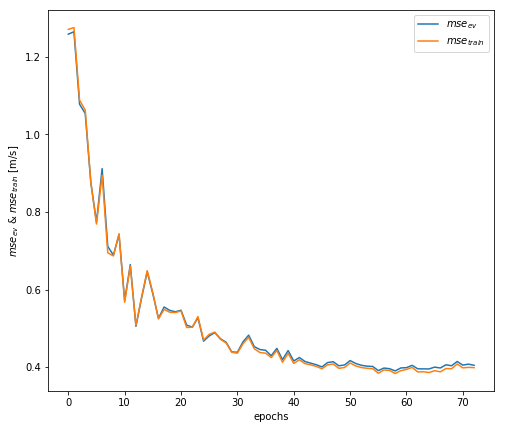

This is  summer
The loss is 1.4230431 

The mse is 1.420165 

The loss is 1.3608332 

The mse is 1.3534949 

The loss is 1.2230059 

The mse is 1.2148256 

The loss is 1.1488278 

The mse is 1.1437907 

The loss is 1.0073731 

The mse is 1.0052875 

The loss is 0.9298168 

The mse is 0.9278934 

The loss is 0.9122189 

The mse is 0.91282386 

The loss is 0.69638294 

The mse is 0.7051106 

The loss is 0.7584335 

The mse is 0.77663845 

The loss is 0.6752429 

The mse is 0.69174176 

The loss is 0.7004089 

The mse is 0.712957 

The loss is 0.6500719 

The mse is 0.664245 

The loss is 0.7505312 

The mse is 0.76291454 

The loss is 0.70070404 

The mse is 0.71161556 

The loss is 0.7069222 

The mse is 0.7104211 

The loss is 0.6656514 

The mse is 0.6691398 

The loss is 0.6173218 

The mse is 0.62163264 

The loss is 0.62826073 

The mse is 0.6352879 

The loss is 0.63202435 

The mse is 0.6456651 

The loss is 0.64352894 

The mse is 0.65709955 

The loss is 0.58062476 

The mse is

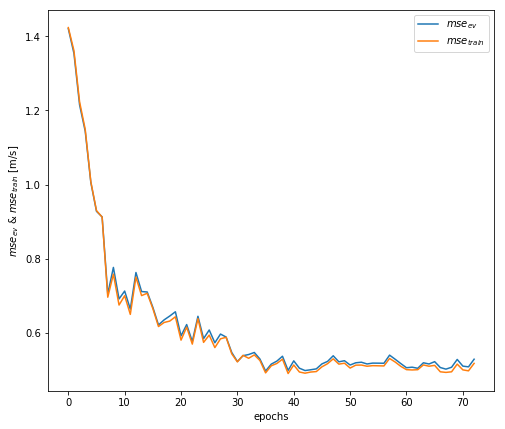

This is  autumn
The loss is 1.4501382 

The mse is 1.4714035 

The loss is 1.4406748 

The mse is 1.4583722 

The loss is 1.2850622 

The mse is 1.3030841 

The loss is 1.2257107 

The mse is 1.244879 

The loss is 1.0968578 

The mse is 1.1196666 

The loss is 1.0381526 

The mse is 1.0639174 

The loss is 0.9879161 

The mse is 1.013995 

The loss is 0.8041668 

The mse is 0.8225757 

The loss is 0.8723805 

The mse is 0.88673973 

The loss is 0.7447528 

The mse is 0.75777704 

The loss is 0.7288508 

The mse is 0.7501283 

The loss is 0.7090997 

The mse is 0.72851485 

The loss is 0.744156 

The mse is 0.7563002 

The loss is 0.7751234 

The mse is 0.7843369 

The loss is 0.6727706 

The mse is 0.68043023 

The loss is 0.7101177 

The mse is 0.723316 

The loss is 0.686726 

The mse is 0.70108503 

The loss is 0.6481771 

The mse is 0.6600497 

The loss is 0.85839045 

The mse is 0.87375236 

stopped for too big increase in mse


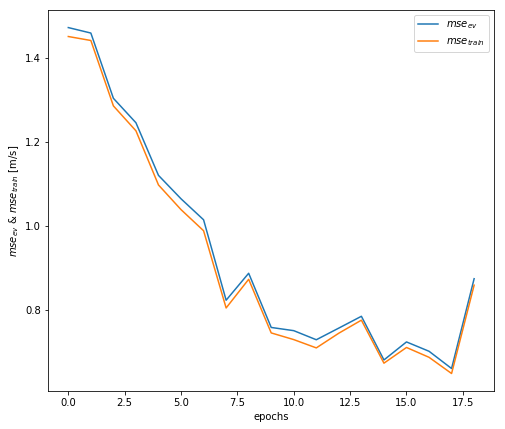

This is  winter
The loss is 2.364898 

The mse is 2.3309562 

The loss is 2.1757529 

The mse is 2.1446605 

The loss is 1.8655845 

The mse is 1.8593276 

The loss is 1.6942766 

The mse is 1.6989101 

The loss is 1.5463083 

The mse is 1.5531806 

The loss is 1.5393564 

The mse is 1.5551771 

The loss is 1.138763 

The mse is 1.119567 

The loss is 1.1617515 

The mse is 1.1563021 

The loss is 0.8814999 

The mse is 0.90218335 

The loss is 0.8769669 

The mse is 0.8912525 

The loss is 1.0001976 

The mse is 1.0081681 

The loss is 0.7960461 

The mse is 0.8075125 

The loss is 0.8170912 

The mse is 0.8185623 

The loss is 0.767766 

The mse is 0.7642453 

The loss is 0.71440715 

The mse is 0.72294307 

The loss is 0.9436787 

The mse is 0.95189106 

The loss is 1.0247588 

The mse is 1.0261401 

The loss is 0.76943606 

The mse is 0.7705358 

The loss is 0.7626716 

The mse is 0.76390105 

The loss is 0.69846606 

The mse is 0.70023113 

The loss is 0.71262664 

The mse is 0.71

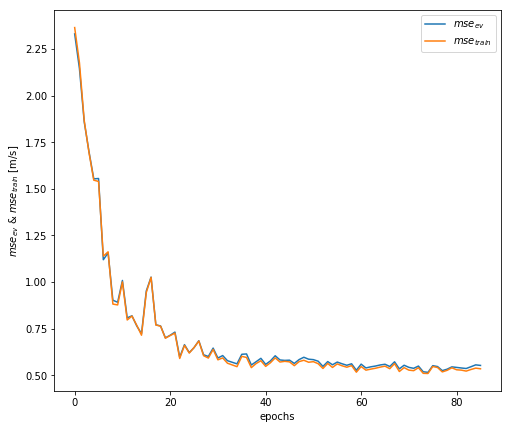

In [26]:
seasons_data=[x_tr_standard_variables, y_tr_variables, x_ev_standard_hs_variables, x_ev_standard_variables, y_ev_hs_seasons, y_ev_variables,X_te_standard_hs_variables,Y_tes_hs_]
y_preds_seasons ,y_preds_seasons_test=season_training(seasons_data, 300)

Plotting the results season wise of evaluation data

spring


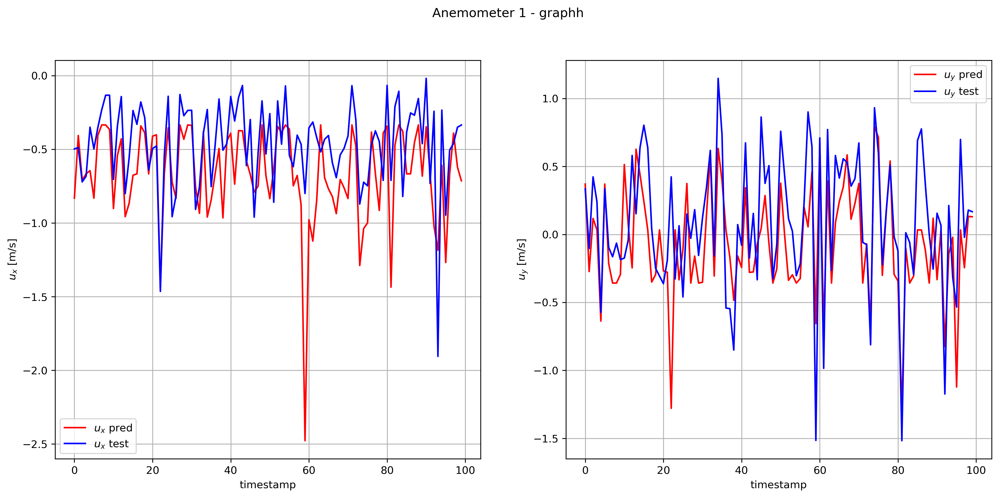

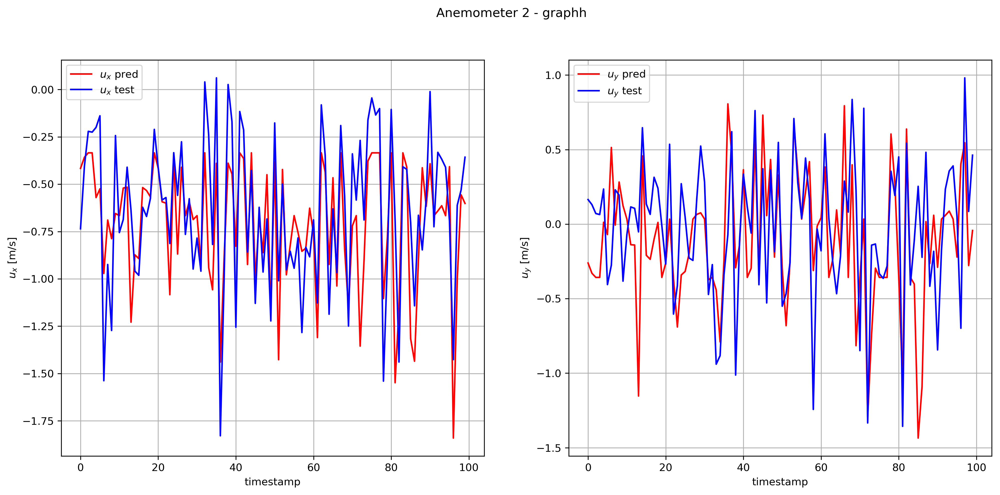

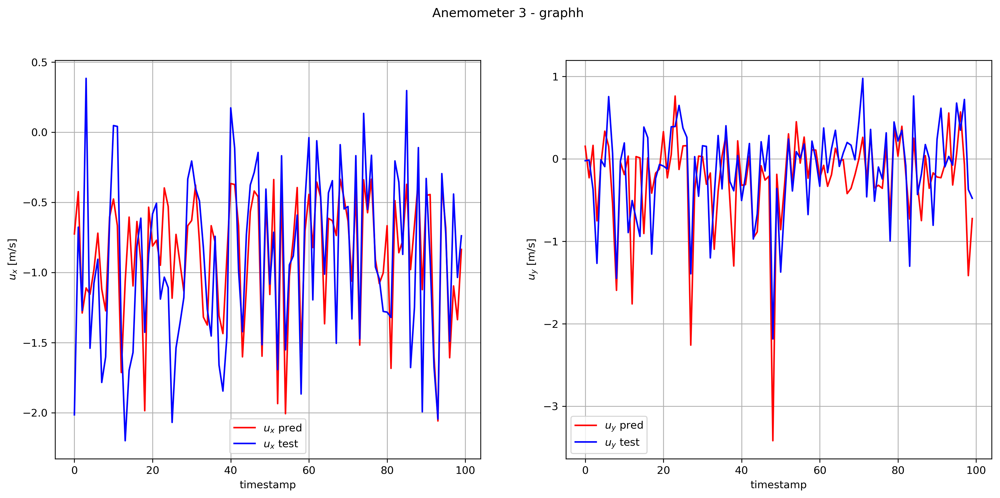

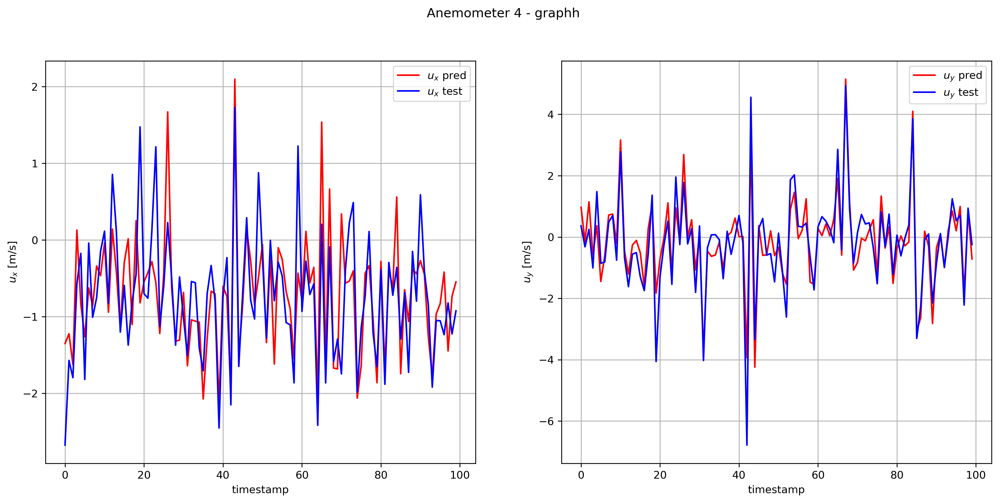

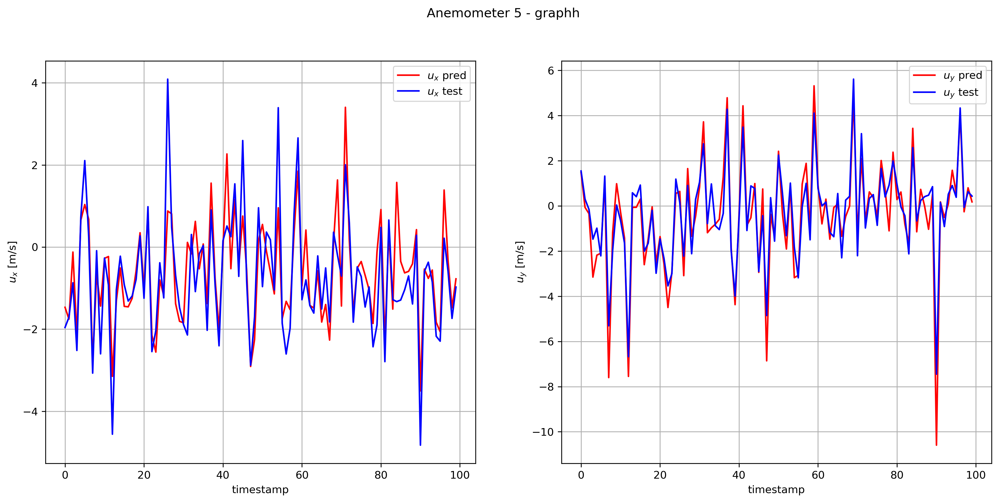

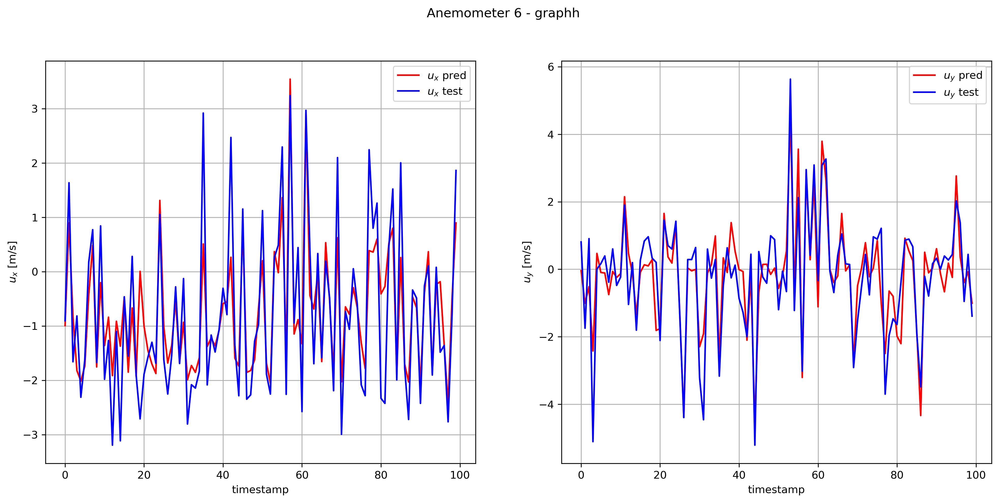

summer


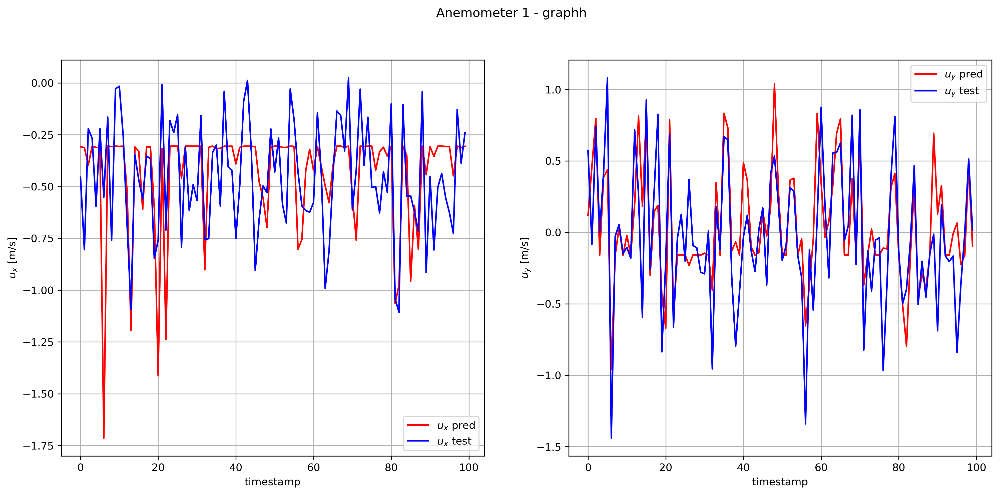

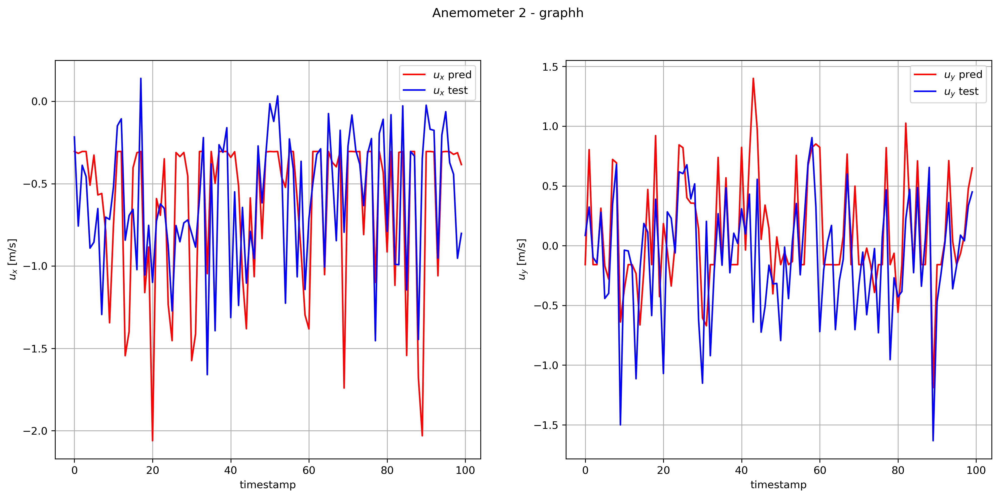

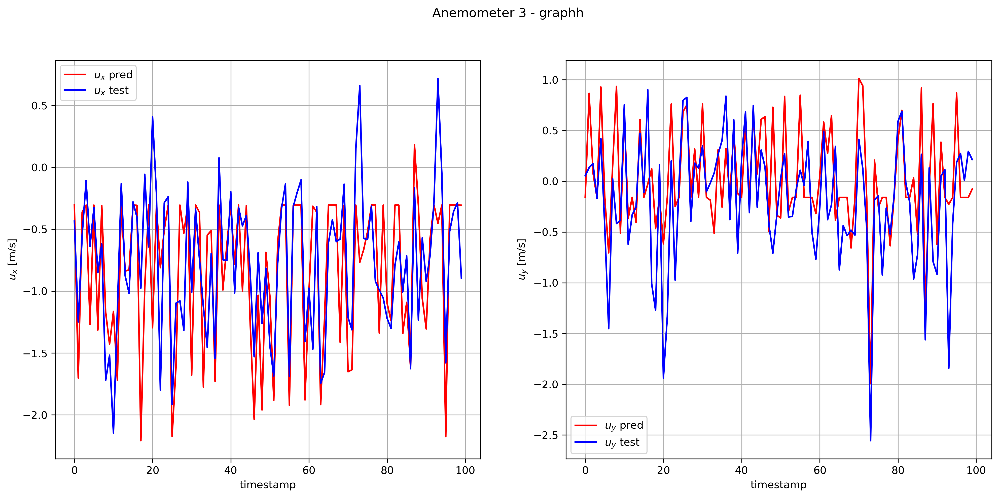

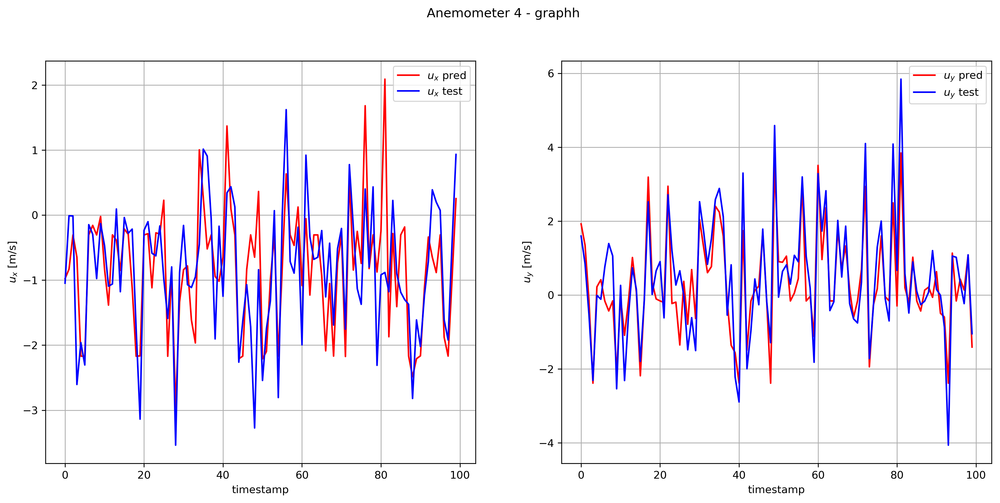

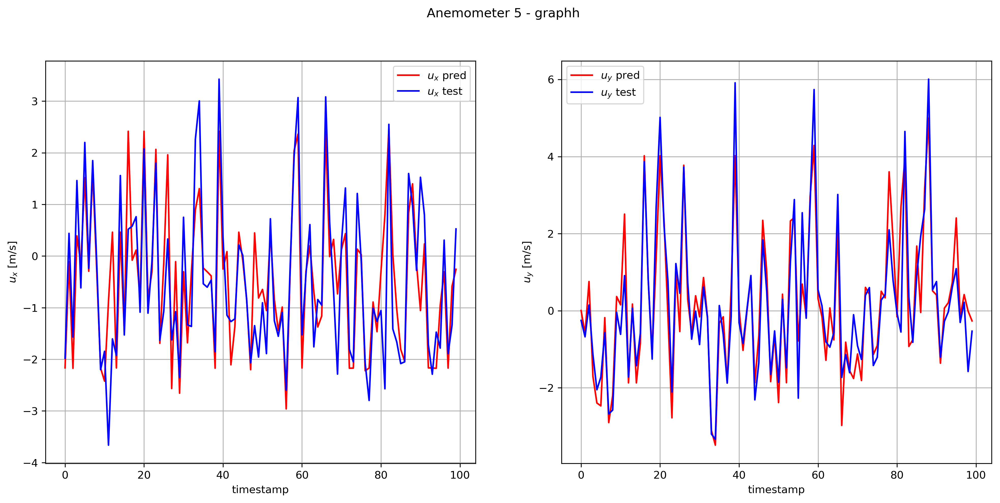

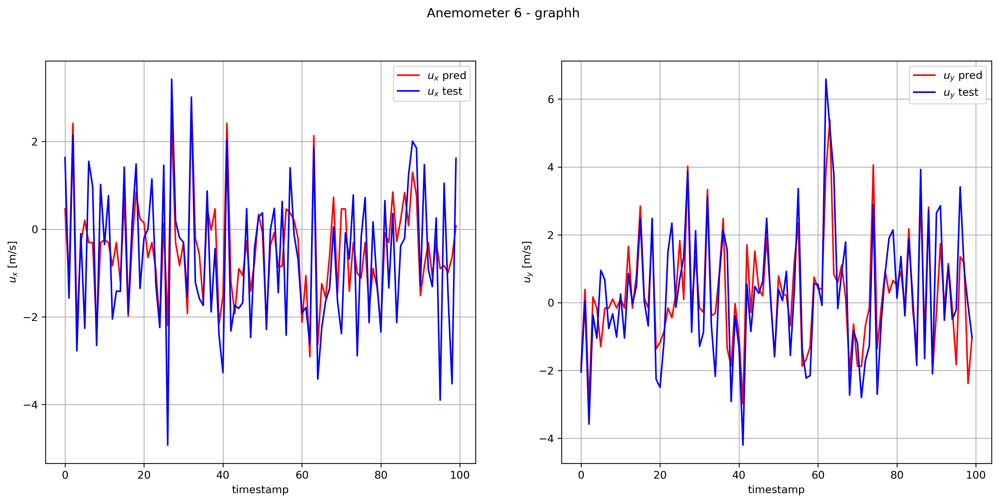

autumn


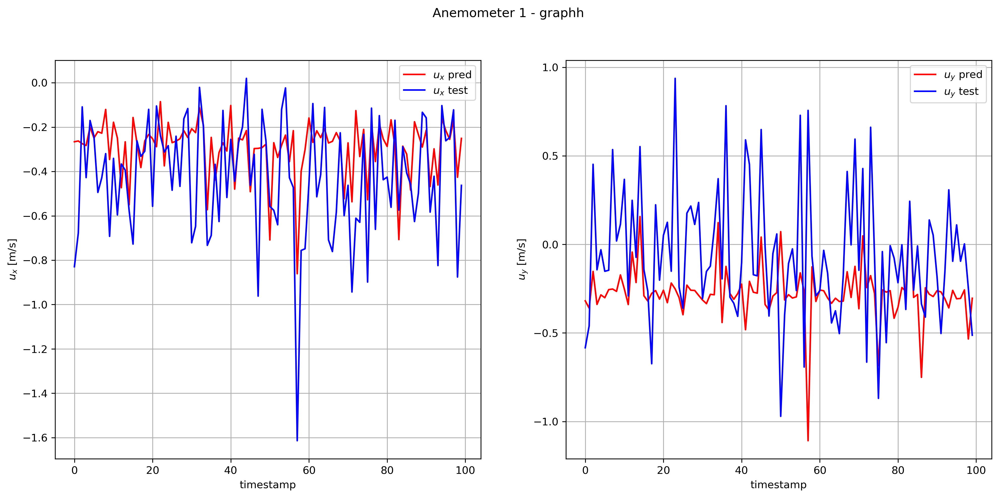

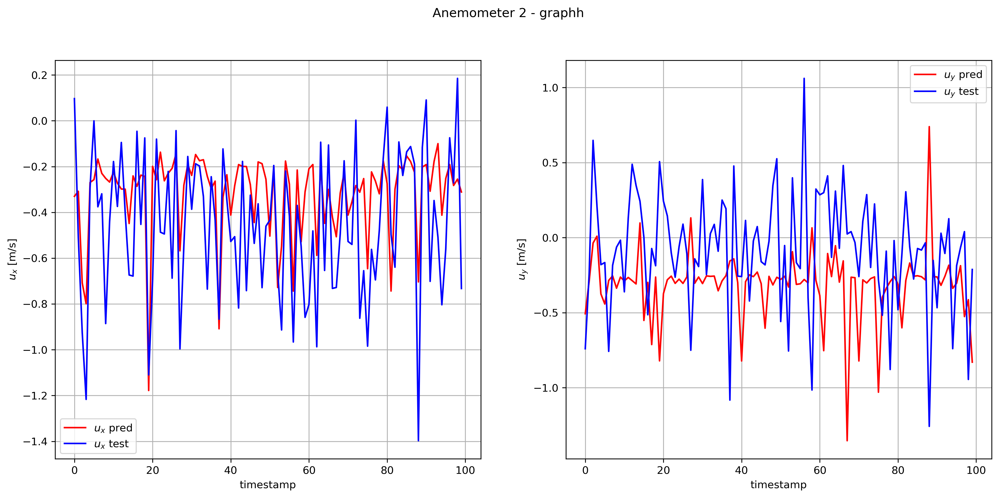

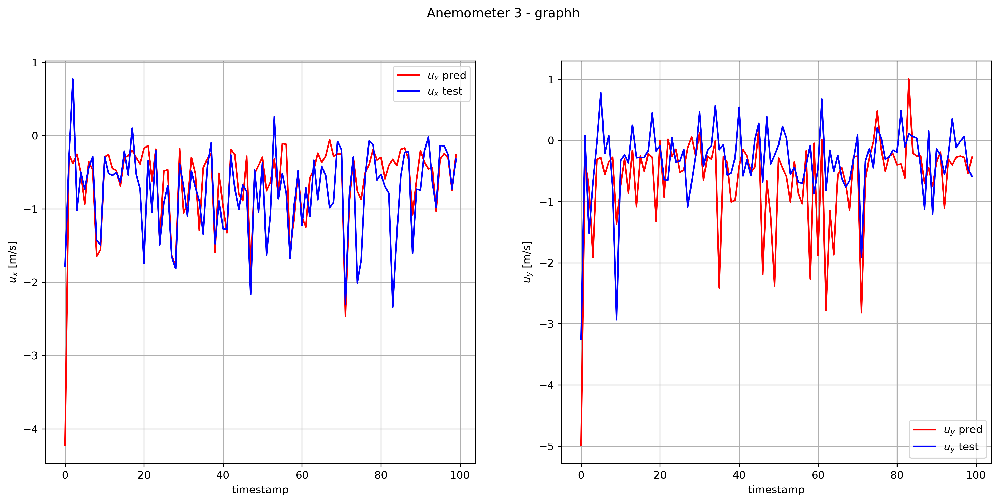

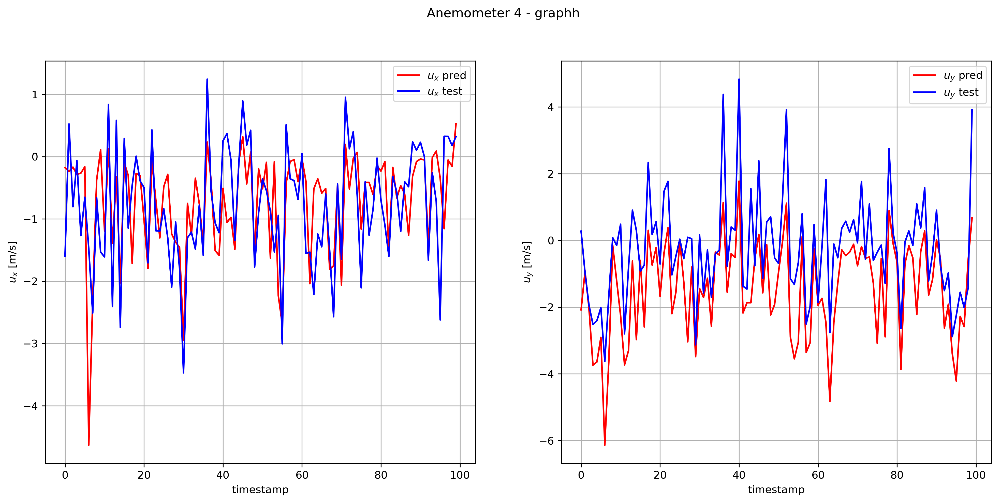

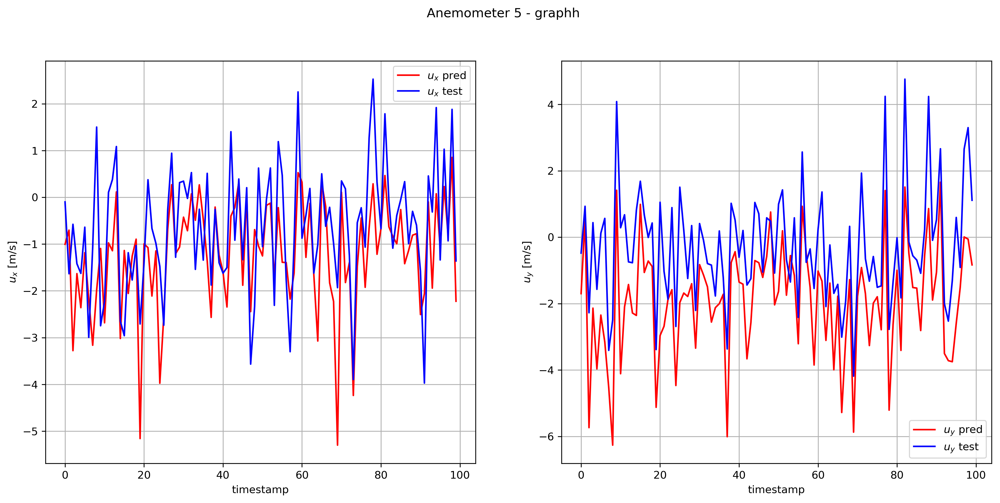

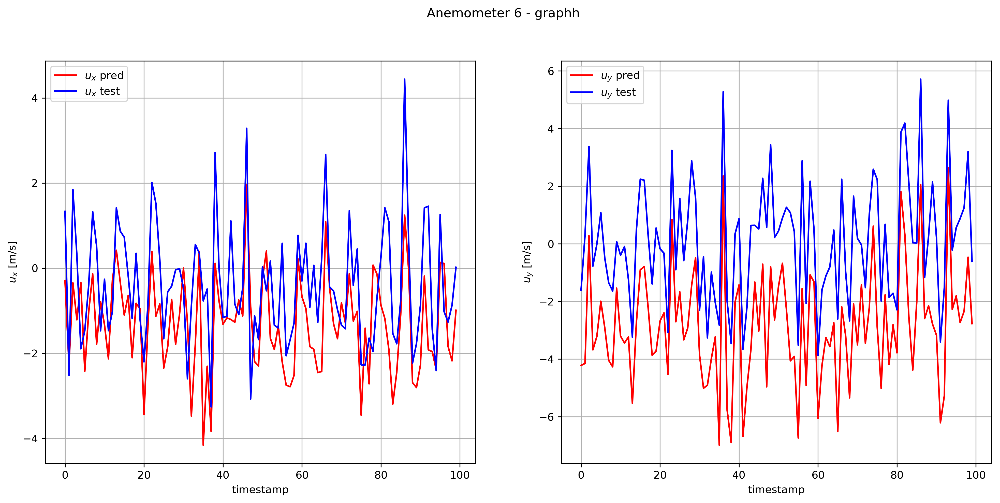

winter


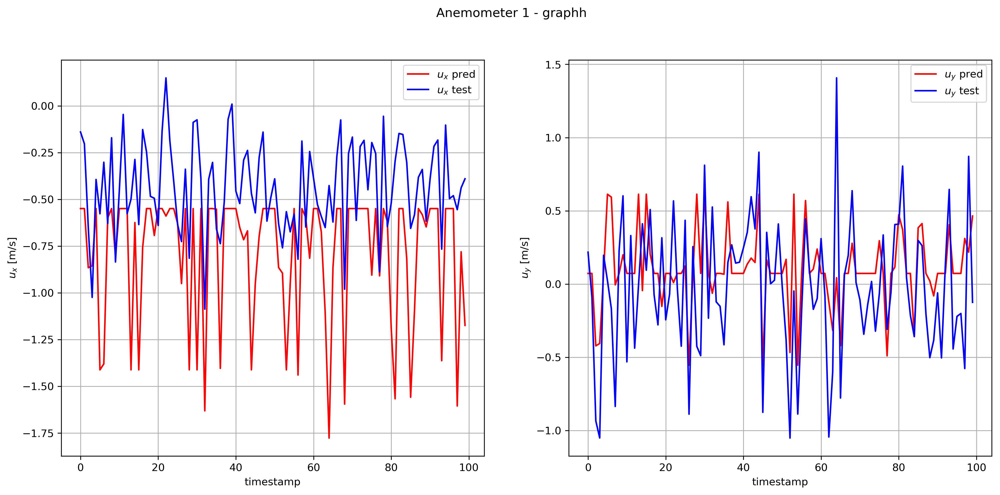

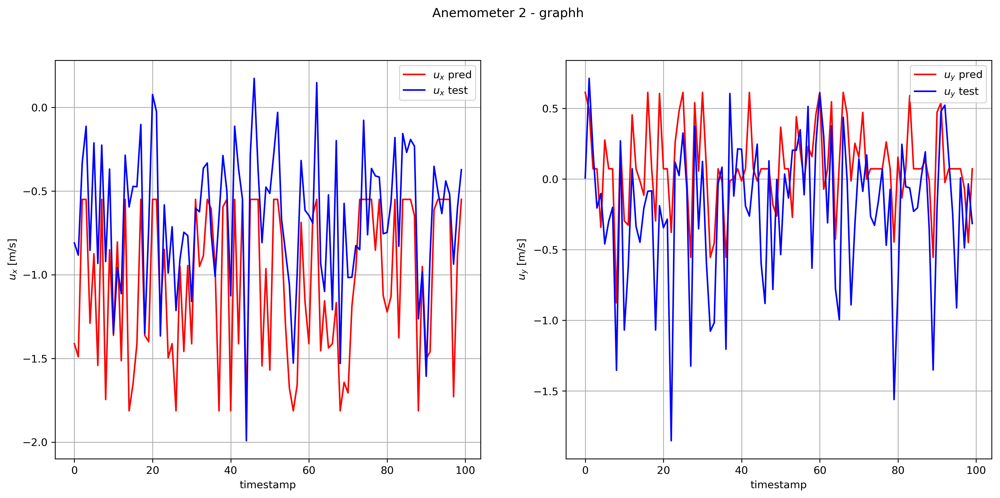

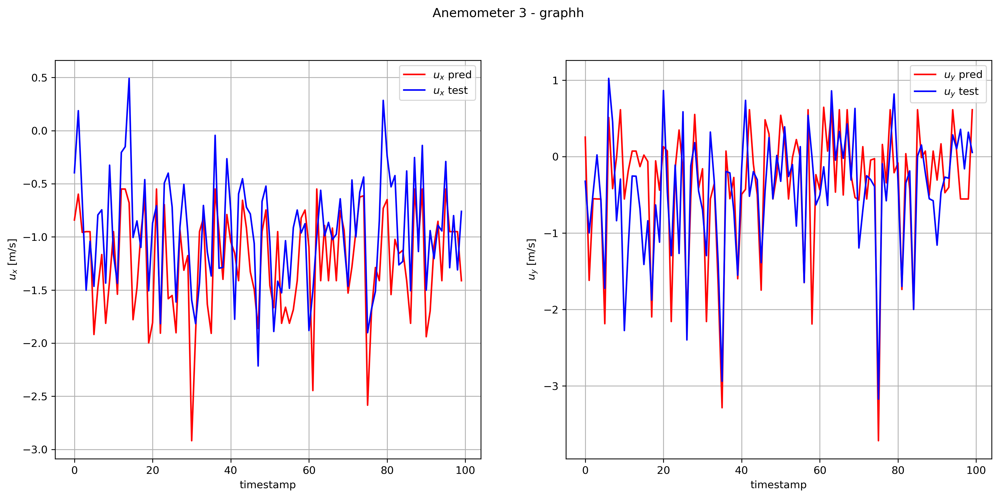

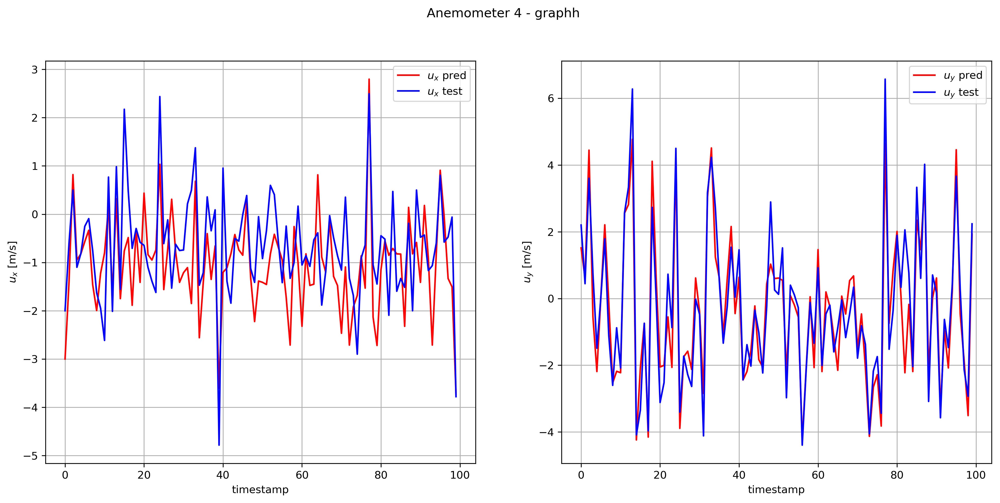

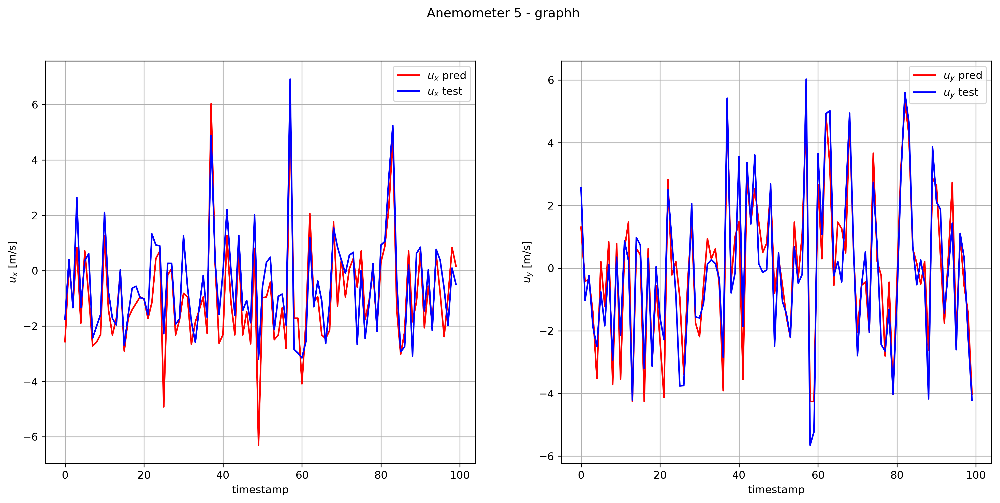

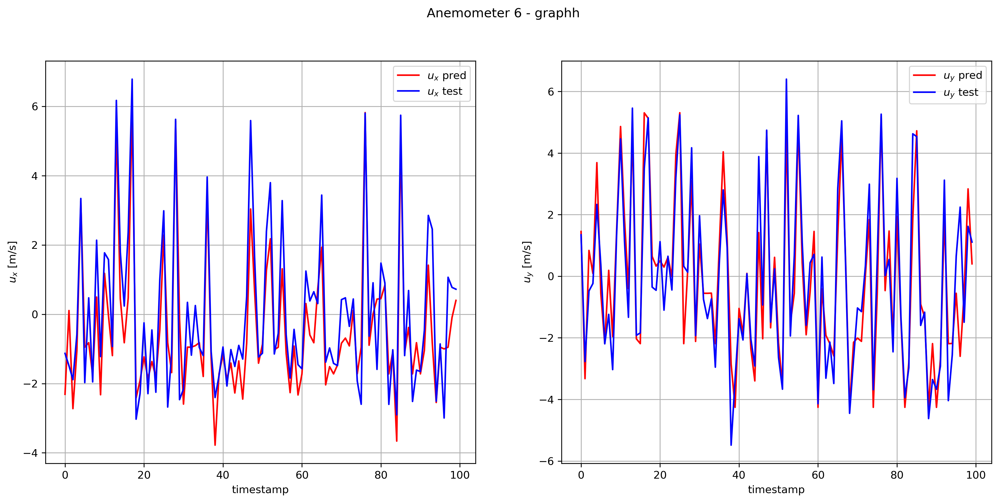

In [27]:
for y_preds,y_ev_hs_season, season in zip(y_preds_seasons, y_ev_hs_seasons, ['spring', 'summer', 'autumn', 'winter']):
    
    print (season)
    # input the evaluation or testing y which are already splitted per anemometer
    plot_ys(y_preds,y_ev_hs_season,RESULTS_FOLDER,save=False,interval=[100,200],name='graphh')

Visulaize the performance of the predictions for the evaluation set

In [28]:
for y_preds,y_ev_hs_season, season in zip(y_preds_seasons, y_ev_hs_seasons, ['spring', 'summer', 'autumn', 'winter']):
    
    print ()
    print (season)
    print ()
    for i, (y_pred, y_ev_h_) in enumerate(zip(y_preds, y_ev_hs_season)):
        
        r_squared=1-np.sum((y_ev_h_-y_pred)**2, axis=0)/np.sum((y_ev_h_-np.average(y_ev_h_, axis=0))**2, axis=0)
        #take the mean between the value of the r_squared and the mse for u_x and u_y
        print ('R-Squared', np.mean(r_squared))
        print ('MSE anemometer'+' ', i , 'is', np.mean(np.square(y_pred-y_ev_h_)))


spring

R-Squared 0.07847216338700547
MSE anemometer  0 is 0.1308878727237422
R-Squared 0.3101662206250017
MSE anemometer  1 is 0.1363559481985609
R-Squared 0.3926932502340686
MSE anemometer  2 is 0.21930615018681915
R-Squared 0.609412180187067
MSE anemometer  3 is 0.49063227660470626
R-Squared 0.7359787292934394
MSE anemometer  4 is 0.604262664431968
R-Squared 0.7035593001450464
MSE anemometer  5 is 0.8793376953944357

summer

R-Squared 0.06836723139392809
MSE anemometer  0 is 0.11646647441266515
R-Squared -0.0072658219147744285
MSE anemometer  1 is 0.18577083450132587
R-Squared 0.2188132018453962
MSE anemometer  2 is 0.2661230362404517
R-Squared 0.5602624522029951
MSE anemometer  3 is 0.6141544773013835
R-Squared 0.7206902750186662
MSE anemometer  4 is 0.7544859015309382
R-Squared 0.6497441512053608
MSE anemometer  5 is 1.1599501737040974

autumn

R-Squared -0.14191429925322385
MSE anemometer  0 is 0.13759878031218892
R-Squared -0.33389139454716243
MSE anemometer  1 is 0.18509176021

Plotting the results season wise of test data and save them

In [29]:
for y_preds,y_te_hs_season, season in zip(y_preds_seasons_test, Y_tes_hs_, ['spring', 'summer', 'autumn', 'winter']):
    
    print (season)
    # input the evaluation or testing y which are already splitted per anemometer
    plot_ys(y_preds,y_te_hs_season,RESULTS_FOLDER,save=True,interval=[100,200],name=season+'i')

spring
summer
autumn
winter


Visulaize the performance of the predictions for the test set

In [30]:
d_mses={}
d_rsquared={}
for k, (y_preds,y_te_hs_season, season) in enumerate(zip(y_preds_seasons_test, Y_tes_hs_, ['spring', 'summer', 'autumn', 'winter'])):
    
    print ()
    print (season)
    print ()
    
    mses=[]
    rs_squared=[]
    
    for i, (y_pred, y_te_h_) in enumerate(zip(y_preds, y_te_hs_season)):
        
        
        r_squared=1-np.sum((y_te_h_-y_pred)**2, axis=0)/np.sum((y_te_h_-np.average(y_te_h_, axis=0))**2, axis=0)
        #take the mean between the value of the r_squared and the mse for u_x and u_y
        print ('R-Squared', np.mean(r_squared))
        print ('MSE anemometer'+' ', i , 'is', np.mean(np.square(y_pred-y_te_h_)))
        
        mses.append(np.mean(np.square(y_pred-y_te_h_)))
        rs_squared.append(np.mean(r_squared))

        
    #formatting and inserting the name of the season in both mse and rsquared
    mses.append(season)
    rs_squared.append(season)
    d_mses[str(k)]=mses
    d_rsquared[str(k)]=rs_squared
df_mses=pd.DataFrame(data=d_mses)
df_rsquared=pd.DataFrame(data=d_rsquared)
df_mses=df_mses.T
df_rsquared=df_rsquared.T
df_mses.to_csv(RESULTS_FOLDER+'mses_u_seasons.txt',header=None)
df_rsquared.to_csv(RESULTS_FOLDER+'rsquared_u_seasons.txt' ,header=None)


spring

R-Squared 0.09454817781083635
MSE anemometer  0 is 0.13464402439491416
R-Squared 0.30383498362557926
MSE anemometer  1 is 0.1378902889037065
R-Squared 0.4297618129774977
MSE anemometer  2 is 0.21737572372316122
R-Squared 0.6099630456326135
MSE anemometer  3 is 0.49760130359153265
R-Squared 0.7335324200132005
MSE anemometer  4 is 0.6021132968092792
R-Squared 0.7077465410938797
MSE anemometer  5 is 0.8981256971579763

summer

R-Squared 0.09511447508702492
MSE anemometer  0 is 0.11332538688381187
R-Squared 0.04973048263886454
MSE anemometer  1 is 0.17817878836100134
R-Squared 0.22287192567401604
MSE anemometer  2 is 0.2793919954753967
R-Squared 0.5497625472438886
MSE anemometer  3 is 0.6171333088465007
R-Squared 0.7132880515021323
MSE anemometer  4 is 0.7590068821205176
R-Squared 0.6711555750445208
MSE anemometer  5 is 1.1282272419619277

autumn

R-Squared -0.12453126206852749
MSE anemometer  0 is 0.13928996894123166
R-Squared -0.3231731537425743
MSE anemometer  1 is 0.1942829226

## Predict results for the whole year

Establish loss function and optimizer for the complete test

In [31]:
# set the network before training it                                                                   
net = Net(n_feature=x_tr.detach().numpy().shape[1], n_hidden=100, n_output=2)
loss_func = torch.nn.MSELoss() 
optimizer = torch.optim.SGD(net.parameters(), lr=0.2)

Train the net for the full year

In [32]:
# insert dummy index
training_net(x_tr, y_tr, x_ev, y_ev, 2000, 0,net, optimizer, loss_func, season=False)

The loss is 1.6355752 

The mse is 1.6360122 

The loss is 1.7168808 

The mse is 1.7165579 

The loss is 1.4135978 

The mse is 1.4141889 

The loss is 1.3957897 

The mse is 1.3977821 

The loss is 1.1586249 

The mse is 1.156833 

The loss is 1.1773901 

The mse is 1.1762265 

The loss is 0.90008134 

The mse is 0.89611775 

The loss is 0.9105675 

The mse is 0.9048256 

The loss is 0.8976699 

The mse is 0.8956742 

The loss is 0.761496 

The mse is 0.7612388 

The loss is 0.8936454 

The mse is 0.89644605 

The loss is 0.73790455 

The mse is 0.7411333 

The loss is 0.81479716 

The mse is 0.8192553 

The loss is 0.7810229 

The mse is 0.7871493 

The loss is 0.8226185 

The mse is 0.8279308 

stopped for too big increase in mse


In [33]:
y_preds_year=prediction_network(x_ev_standard_hs_variable,net)
y_preds_year_test=prediction_network(X_te_standard_hs_variable,net)

Plotting results year wise for evaluation data

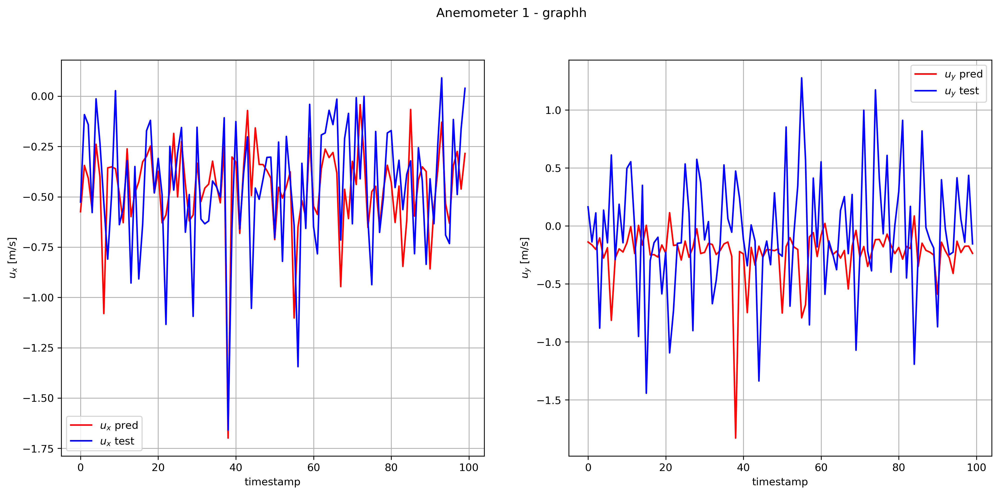

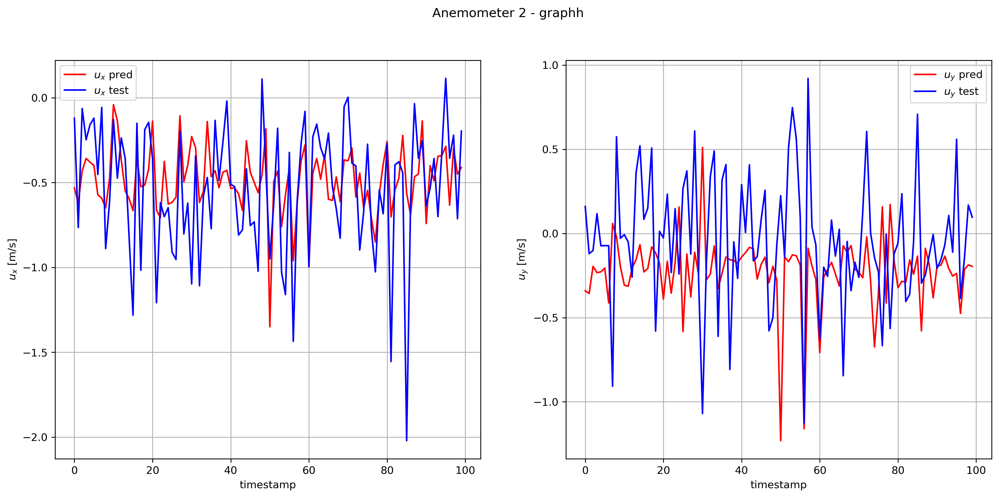

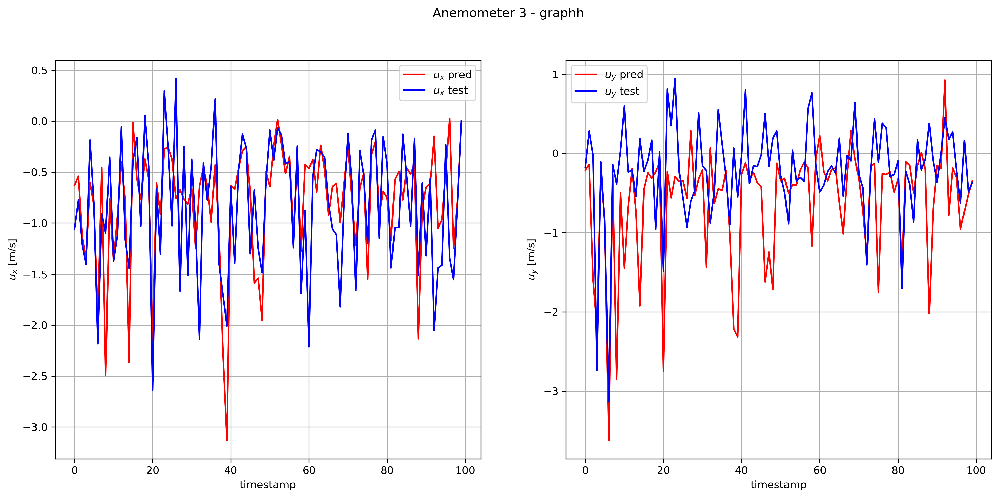

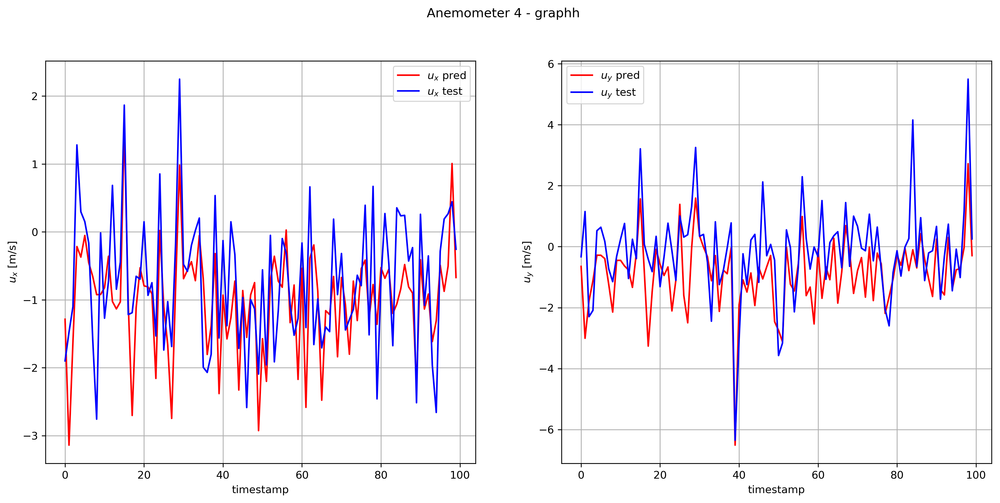

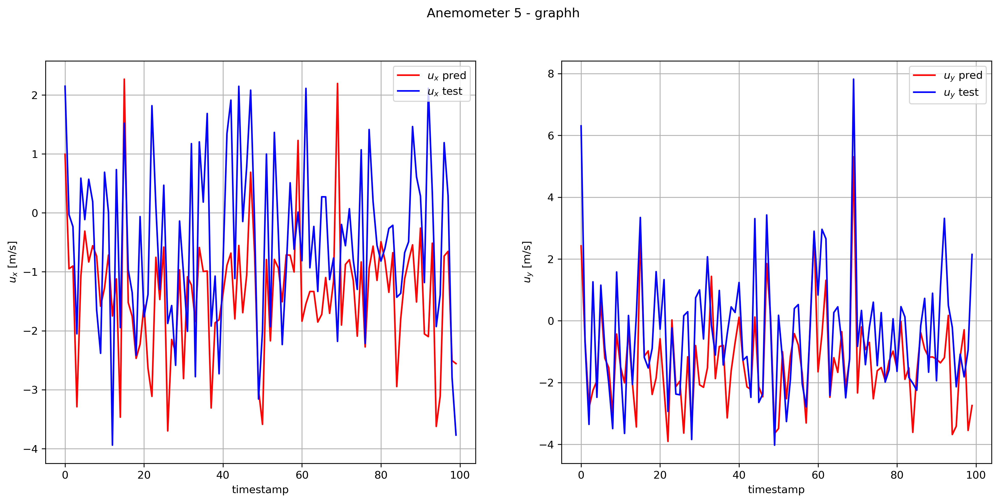

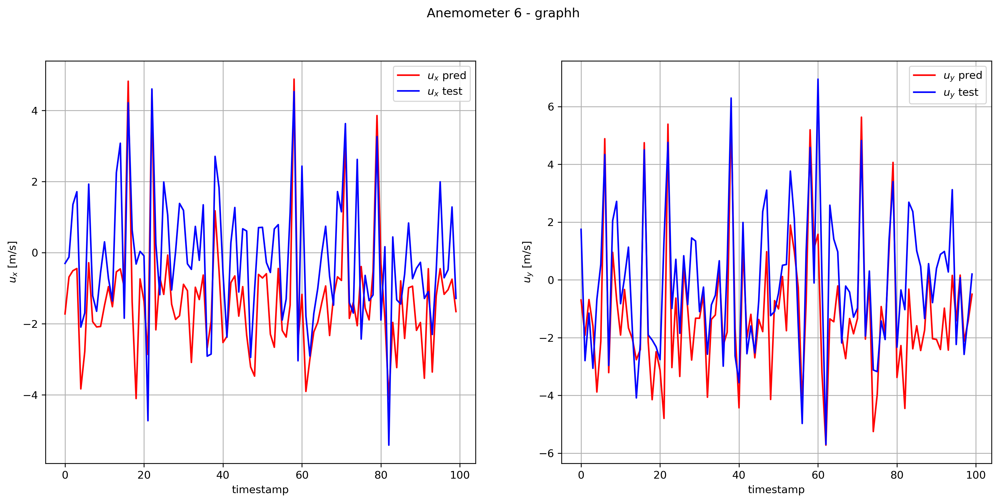

In [34]:
plot_ys(y_preds_year,y_ev_hs_,RESULTS_FOLDER,save=False,interval=[100,200],name='graphh')

Visulaize the performance of the predictions for the evaluation set

In [35]:
for i, (y_pred, y_ev_h_) in enumerate(zip(y_preds_year, y_ev_hs_)):
    
    r_squared=1-np.sum((y_ev_h_-y_pred)**2, axis=0)/np.sum((y_ev_h_-np.average(y_ev_h_, axis=0))**2, axis=0)
    print ('R-Squared', r_squared)
    print ('MSE anemometer'+' ', i , 'is', np.mean(np.square(y_pred-y_ev_h_)))
    plt.show()

R-Squared [ 0.24500631 -0.18355779]
MSE anemometer  0 is 0.16496560560026285
R-Squared [ 0.33409071 -0.6002505 ]
MSE anemometer  1 is 0.23185993958325124
R-Squared [ 0.05384906 -0.40499282]
MSE anemometer  2 is 0.4596003624747096
R-Squared [0.29108081 0.23704715]
MSE anemometer  3 is 1.4414928372456033
R-Squared [0.25489561 0.32442546]
MSE anemometer  4 is 2.3140830897062084
R-Squared [0.19329563 0.07303949]
MSE anemometer  5 is 3.577469759805276


Plotting results year wise for test data

In [36]:
plot_ys(y_preds_year_test,Y_te_hs_,RESULTS_FOLDER,save=True,interval=[100,200],name='graphh')

Visulaize the performance of the predictions for the test set

In [37]:
for i, (y_pred, y_te_h_) in enumerate(zip(y_preds_year_test, Y_te_hs_)):
    
    r_squared=1-np.sum((y_te_h_-y_pred)**2, axis=0)/np.sum((y_te_h_-np.average(y_te_h_, axis=0))**2, axis=0)
    print ('R-Squared', r_squared)
    print ('MSE anemometer'+' ', i , 'is', np.mean(np.square(y_pred-y_te_h_)))
    plt.show()

R-Squared [ 0.06830317 -0.14630092]
MSE anemometer  0 is 0.1935752148000914
R-Squared [ 0.09527198 -0.3987475 ]
MSE anemometer  1 is 0.2600272410047019
R-Squared [-0.1263357   0.26507724]
MSE anemometer  2 is 0.4753914232819972
R-Squared [0.32135401 0.57467272]
MSE anemometer  3 is 1.346819823568102
R-Squared [0.39261472 0.68462992]
MSE anemometer  4 is 1.997293072158527
R-Squared [0.46470749 0.61369266]
MSE anemometer  5 is 2.6752012203641264


Averaging the prediction season wise

In [38]:
d_means={}
for k, (y_preds, season) in enumerate(zip(y_preds_seasons_test, ['spring', 'summer', 'autumn', 'winter'])):
    
    print ()
    print (season)
    print ()
    
    means=[]
    
    for i, y_pred in enumerate(y_preds):
        
        #take the mean between the value of the r_squared and the mse for u_x and u_y
        print ('Average for anemometer'+' ', i , 'is', magnitude_avg(y_pred))

        means.append(magnitude_avg(y_pred))

        
    #formatting and inserting the name of the season in both mse and rsquared
    means.append(season)

    d_means[str(k)]=means

df_means=pd.DataFrame(data=d_means)
df_means=df_means.T
df_means.to_csv(RESULTS_FOLDER+'magnitude_average_pred.txt',header=None)


spring

Average for anemometer  0 is 0.71947867
Average for anemometer  1 is 0.79304343
Average for anemometer  2 is 1.0117861
Average for anemometer  3 is 1.4828558
Average for anemometer  4 is 1.8508515
Average for anemometer  5 is 1.7719749

summer

Average for anemometer  0 is 0.54308283
Average for anemometer  1 is 0.66008085
Average for anemometer  2 is 0.9757508
Average for anemometer  3 is 1.4877716
Average for anemometer  4 is 1.9942677
Average for anemometer  5 is 1.7458574

autumn

Average for anemometer  0 is 0.41784495
Average for anemometer  1 is 0.541176
Average for anemometer  2 is 0.9122433
Average for anemometer  3 is 1.7671672
Average for anemometer  4 is 2.7408597
Average for anemometer  5 is 3.6492505

winter

Average for anemometer  0 is 0.91647136
Average for anemometer  1 is 1.0586634
Average for anemometer  2 is 1.3942304
Average for anemometer  3 is 2.2559526
Average for anemometer  4 is 2.7230134
Average for anemometer  5 is 2.775778
